# Covid-19 Data Analysis

### Data Source: 
https://github.com/CSSEGISandData/COVID-19/tree/master/csse_covid_19_data/csse_covid_19_daily_reports

### File naming convention

MM-DD-YYYY.csv in UTC.

### Field description

- Province_State: China - province name; US/Canada/Australia/ - city name, state/province name; Others - name of the event (e.g., "Diamond Princess" cruise ship); other countries - blank.

- Country_Region: country/region name conforming to WHO (will be updated).

- Last_Update: MM/DD/YYYY HH:mm (24 hour format, in UTC).

- Confirmed: the number of confirmed cases. For Hubei Province: from Feb 13 (GMT +8), we report both clinically diagnosed and lab-confirmed cases. For lab-confirmed cases only (Before Feb 17), please refer to who_covid_19_situation_reports. For Italy, diagnosis standard might be changed since Feb 27 to "slow the growth of new case numbers." (Source)

- Deaths: the number of deaths.

- Recovered: the number of recovered cases.

### Data sources and libraries

#### Read the dataset

In [ ]:
import pandas as pd
import pandas as pd
covid = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports/05-10-2021.csv', parse_dates=['Last_Update'])

#https://github.com/CSSEGISandData/COVID-19/tree/master/csse_covid_19_data/csse_covid_19_daily_reports
#the original file is from 01-10-2021

#I have decided to use a database from May 2021 because it seems more trustful. The more recent datasets miss data in active an recovered cases.
#new comment added

#### Display the top 5 rows in the data

In [2]:
covid.head(5)

,FIPS,Admin2,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Combined_Key,Incident_Rate,Case_Fatality_Ratio
0,NaN,NaN,NaN,Afghanistan,2021-05-11 04:20:41,33.93911,67.709953,62063,2698,54382.0,4983.0,Afghanistan,159.428834,4.347196
1,NaN,NaN,NaN,Albania,2021-05-11 04:20:41,41.15330,20.168300,131753,2416,118041.0,11296.0,Albania,4578.254222,1.833734
2,NaN,NaN,NaN,Algeria,2021-05-11 04:20:41,28.03390,1.659600,124288,3335,86554.0,34399.0,Algeria,283.432255,2.683284
3,NaN,NaN,NaN,Andorra,2021-05-11 04:20:41,42.50630,1.521800,13429,127,13021.0,281.0,Andorra,17380.443927,0.945714
4,NaN,NaN,NaN,Angola,2021-05-11 04:20:41,-11.20270,17.873900,28875,636,24772.0,3467.0,Angola,87.856035,2.202597


#### Show the information of the dataset

In [3]:
covid.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3987 entries, 0 to 3986
Data columns (total 14 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   FIPS                 3266 non-null   float64       
 1   Admin2               3271 non-null   object        
 2   Province_State       3813 non-null   object        
 3   Country_Region       3987 non-null   object        
 4   Last_Update          3987 non-null   datetime64[ns]
 5   Lat                  3899 non-null   float64       
 6   Long_                3899 non-null   float64       
 7   Confirmed            3987 non-null   int64         
 8   Deaths               3987 non-null   int64         
 9   Recovered            710 non-null    float64       
 10  Active               709 non-null    float64       
 11  Combined_Key         3987 non-null   object        
 12  Incident_Rate        3899 non-null   float64       
 13  Case_Fatality_Ratio  3944 non-nul

#### Show the sum of missing values of features in the dataset

In [4]:
covid.isna().sum()

FIPS                    721
Admin2                  716
Province_State          174
Country_Region            0
Last_Update               0
Lat                      88
Long_                    88
Confirmed                 0
Deaths                    0
Recovered              3277
Active                 3278
Combined_Key              0
Incident_Rate            88
Case_Fatality_Ratio      43
dtype: int64

#### Show the number of Confirmed cases by Country

In [5]:
#covid.groupby('Country_Region').Confirmed.agg(['sum']),index=False
covid.groupby('Country_Region').Confirmed.sum().reset_index()



,Country_Region,Confirmed
0,Afghanistan,62063
1,Albania,131753
2,Algeria,124288
3,Andorra,13429
4,Angola,28875
...,...,...
190,Vietnam,3489
191,West Bank and Gaza,302249
192,Yemen,6485
193,Zambia,92112


#### Show the number of Deaths by Country

In [6]:
covid.groupby('Country_Region').Deaths.sum().reset_index()

,Country_Region,Deaths
0,Afghanistan,2698
1,Albania,2416
2,Algeria,3335
3,Andorra,127
4,Angola,636
...,...,...
190,Vietnam,35
191,West Bank and Gaza,3378
192,Yemen,1275
193,Zambia,1257


#### Show the number of Recovered cases by Country

In [7]:
covid.groupby('Country_Region').Recovered.sum().reset_index()


,Country_Region,Recovered
0,Afghanistan,54382.0
1,Albania,118041.0
2,Algeria,86554.0
3,Andorra,13021.0
4,Angola,24772.0
...,...,...
190,Vietnam,2618.0
191,West Bank and Gaza,287206.0
192,Yemen,3001.0
193,Zambia,90501.0


#### Show the number of Active Cases by Country

In [8]:
covid.groupby('Country_Region').Active.sum().reset_index()

,Country_Region,Active
0,Afghanistan,4983.0
1,Albania,11296.0
2,Algeria,34399.0
3,Andorra,281.0
4,Angola,3467.0
...,...,...
190,Vietnam,836.0
191,West Bank and Gaza,11665.0
192,Yemen,2209.0
193,Zambia,354.0


#### Show the latest number of Confirmed, Deaths, Recovered and Active cases Country-wise

In [9]:
covid.groupby('Country_Region').agg({'Confirmed':['sum'],
'Deaths': ['sum'],
'Recovered':['sum'],
'Active':['sum'],
'Active':['sum']}).reset_index()

,Country_Region,Confirmed,Deaths,Recovered,Active
,,sum,sum,sum,sum
0,Afghanistan,62063,2698,54382.0,4983.0
1,Albania,131753,2416,118041.0,11296.0
2,Algeria,124288,3335,86554.0,34399.0
3,Andorra,13429,127,13021.0,281.0
4,Angola,28875,636,24772.0,3467.0
...,...,...,...,...,...
190,Vietnam,3489,35,2618.0,836.0
191,West Bank and Gaza,302249,3378,287206.0,11665.0
192,Yemen,6485,1275,3001.0,2209.0


### Show the countries with no recovered cases

In [10]:
no_recovered_cases=covid.groupby('Country_Region').filter(lambda x: x['Recovered'].sum() == 0)
no_recovered_cases.pivot_table(index='Country_Region',values='Recovered',aggfunc='sum')#.reset_index=True

,Recovered
Country_Region,
Belgium,0.0
Kiribati,0.0
Palau,0.0
Serbia,0.0
Summer Olympics 2020,0.0
Sweden,0.0
US,0.0


#### Show the countries with no confirmed cases

In [11]:
no_confirmed_cases=covid.groupby('Country_Region').filter(lambda x: x['Confirmed'].sum() == 0)
no_confirmed_cases.pivot_table(index='Country_Region',values='Confirmed',aggfunc='sum')#.reset_index=True


,Confirmed
Country_Region,
Kiribati,0
Palau,0
Summer Olympics 2020,0


#### Show the countries with no deaths

In [12]:
no_deaths_cases=covid.groupby('Country_Region').filter(lambda x: x['Deaths'].sum() == 0)
no_deaths_cases.pivot_table(index='Country_Region',values='Deaths',aggfunc='sum')#.reset_index=True

,Deaths
Country_Region,
Dominica,0
Holy See,0
Kiribati,0
Marshall Islands,0
Micronesia,0
Palau,0
Saint Kitts and Nevis,0
Samoa,0
Solomon Islands,0


In [13]:
no_deaths_cases=covid.groupby('Country_Region').filter(lambda x: x['Deaths'].sum() == 0)
no_deaths_cases.pivot_table(index='Country_Region',values=['Confirmed','Deaths','Recovered'],aggfunc='sum')#.reset_index=True

,Confirmed,Deaths,Recovered
Country_Region,,,
Dominica,175,0,175.0
Holy See,27,0,15.0
Kiribati,0,0,0.0
Marshall Islands,4,0,4.0
Micronesia,1,0,1.0
Palau,0,0,0.0
Saint Kitts and Nevis,45,0,44.0
Samoa,3,0,2.0
Solomon Islands,20,0,20.0


#### Show the Top 10 countries with Confirmed cases

In [14]:
covid.head(5)

,FIPS,Admin2,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Combined_Key,Incident_Rate,Case_Fatality_Ratio
0,NaN,NaN,NaN,Afghanistan,2021-05-11 04:20:41,33.93911,67.709953,62063,2698,54382.0,4983.0,Afghanistan,159.428834,4.347196
1,NaN,NaN,NaN,Albania,2021-05-11 04:20:41,41.15330,20.168300,131753,2416,118041.0,11296.0,Albania,4578.254222,1.833734
2,NaN,NaN,NaN,Algeria,2021-05-11 04:20:41,28.03390,1.659600,124288,3335,86554.0,34399.0,Algeria,283.432255,2.683284
3,NaN,NaN,NaN,Andorra,2021-05-11 04:20:41,42.50630,1.521800,13429,127,13021.0,281.0,Andorra,17380.443927,0.945714
4,NaN,NaN,NaN,Angola,2021-05-11 04:20:41,-11.20270,17.873900,28875,636,24772.0,3467.0,Angola,87.856035,2.202597


In [15]:
covid.groupby(['Country_Region','Last_Update']).agg({'Confirmed': 'sum','Deaths': 'sum','Recovered': 'sum'}).sort_values('Confirmed', ascending=False)[:10]

,,Confirmed,Deaths,Recovered
Country_Region,Last_Update,,,
US,2021-05-11 04:20:41,32801021,582174,0.0
India,2021-05-11 04:20:41,22992517,249992,19027304.0
Brazil,2021-05-11 04:20:41,15209990,423229,13481062.0
France,2021-05-11 04:20:41,5841626,106847,372400.0
Turkey,2021-05-11 04:20:41,5044936,43311,4743871.0
Russia,2021-05-11 04:20:41,4832959,111740,4451443.0
United Kingdom,2021-05-11 04:20:41,4452956,127870,15088.0
Italy,2021-05-11 04:20:41,4116287,123031,3619586.0
Spain,2021-05-11 04:20:41,3581392,78895,150376.0


#### Show the Top 10 Countries with Active cases

In [16]:
covid.groupby(['Country_Region','Last_Update']).agg({'Confirmed': 'sum','Deaths': 'sum','Recovered': 'sum','Active': 'sum'}).sort_values('Active', ascending=False)[:10]

,,Confirmed,Deaths,Recovered,Active
Country_Region,Last_Update,,,,
France,2021-05-11 04:20:41,5841626,106847,372400.0,5362348.0
United Kingdom,2021-05-11 04:20:41,4452956,127870,15088.0,4309998.0
India,2021-05-11 04:20:41,22992517,249992,19027304.0,3715221.0
Spain,2021-05-11 04:20:41,3581392,78895,150376.0,3352121.0
Netherlands,2021-05-11 04:20:41,1592742,17602,26310.0,1548830.0
Brazil,2021-05-11 04:20:41,15209990,423229,13481062.0,1305699.0
Sweden,2021-05-11 04:20:41,1007792,14173,0.0,993619.0
Belgium,2021-05-11 04:20:41,1017876,24583,0.0,993293.0
Serbia,2021-05-11 04:20:41,701326,6576,0.0,694750.0


#### Plot Country-wise Total deaths, confirmed, recovered and active casaes where total deaths have exceeded 50,000

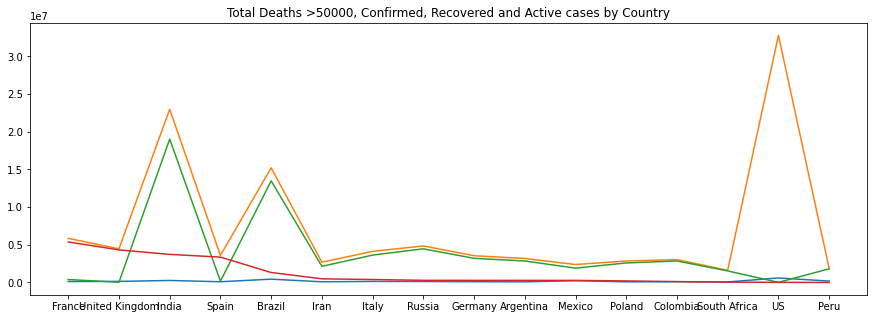

In [17]:
import matplotlib.pyplot as plt
deaths50000=covid.groupby('Country_Region').filter(lambda x: x['Deaths'].sum() >50000).sort_values('Deaths', ascending=False)
deathsfiltered=deaths50000.groupby('Country_Region').agg({'Deaths': 'sum','Confirmed': 'sum','Recovered': 'sum','Active': 'sum'}).sort_values('Active', ascending=False)
plt.figure(figsize=(15, 5))
plt.plot(deathsfiltered)
plt.title('Total Deaths >50000, Confirmed, Recovered and Active cases by Country')
plt.show()

#,kind='line'


### Plot Province/State wise Deaths in USA

In [18]:
import plotly.express as px

In [19]:
covid_data= pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports/01-09-2021.csv')

In [20]:
covid_data.columns

Index(['FIPS', 'Admin2', 'Province_State', 'Country_Region', 'Last_Update',
       'Lat', 'Long_', 'Confirmed', 'Deaths', 'Recovered', 'Active',
       'Combined_Key', 'Incident_Rate', 'Case_Fatality_Ratio'],
      dtype='object')

In [21]:
us_datadeaths = covid_data[covid_data['Country_Region']=='US'].drop(['Country_Region'], axis=1)
state_fig = px.bar(us_datadeaths.groupby(['Province_State'])['Deaths'].sum(), y='Deaths', title='State wise deaths reported of COVID-19 in USA', text='Deaths')
state_fig.show()

### Plot Province/State Wise Active Cases in USA

In [22]:
us_dataactive = covid_data[covid_data['Country_Region']=='US'].drop(['Country_Region'], axis=1)
state_fig = px.bar(us_dataactive.groupby(['Province_State'])['Active'].sum(), y='Active', title='State wise Active cases reported of COVID-19 in USA', text='Active')
state_fig.show()

### Plot Province/State Wise Confirmed cases in USA

In [23]:
us_dataconfirmed = covid_data[covid_data['Country_Region']=='US'].drop(['Country_Region'], axis=1)
state_fig = px.bar(us_dataconfirmed.groupby(['Province_State'])['Confirmed','Deaths','Recovered','Active'].sum(), title='State wise Confirmed cases reported of COVID-19 in USA', text='Active')
state_fig.show()

C:\Users\eduar\AppData\Local\Temp/ipykernel_30044/2176722089.py:2: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



In this dataset, from Sep, 1, 2021 there is no data for Active cases for US. Maybe they are not reporting it anymore.

### Plot Worldwide Confirmed Cases over time

In [24]:
import plotly.express as px
import plotly.io as pio

In the original file there is only data available for Dec 2020 and Jan 2021. Another monthly report files also have only data for the last update on the data. It is not suitable for ploting a timeseries analysis. 
Because of that, I have decided to use another dataset, also available in the same github account. In this dataset you can see a real timeseries and it is a better representation of a real world analysis. However, I see the number of deaths in this timeseries analysis doesn't match with the oficial numbers, so maybe there is some work to do here yet

In [25]:
covid_timesieries = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')

df = covid_timesieries.melt(id_vars = ['Province/State','Country/Region','Lat','Long'], var_name = 'dates', value_name = 'Confirmed Cases')

df['dates']=pd.to_datetime(df['dates'])

plotconfirmedovertime = px.line(df,x='dates',y='Confirmed Cases', title='Worldwide confirmed novel Coronavirus (Covid-19) over time ', text='Confirmed Cases')
plotconfirmedovertime.show()